In [1]:
import numpy as np
#import matplotlib.pyplot as plt
import pandas as pd
import datetime
import matplotlib.pylab as plt
import seaborn as sns

#to scale the data using z-score 
from sklearn.preprocessing import StandardScaler

#importing clustering algorithms
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN

#Silhouette score
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore")

In [17]:
#import dataset
dataset = pd.read_csv('credit_data.csv')

In [18]:
dataset.info()
dataset.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [19]:
dataset[dataset.duplicated()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE


In [20]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [21]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [22]:
#dataset = dataset.dropna()



In [23]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [24]:
dataset.head()


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [25]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [26]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [27]:
data_new = dataset.copy()

In [28]:
data_new.drop(['CUST_ID'], axis=1, inplace=True)

In [29]:
data_new.dropna(subset=['CREDIT_LIMIT'], inplace=True)

In [31]:
data_new['MINIMUM_PAYMENTS'].fillna(data_new['MINIMUM_PAYMENTS'].median(), inplace=True)

BALANCE_FREQUENCY
Skew : -2.02


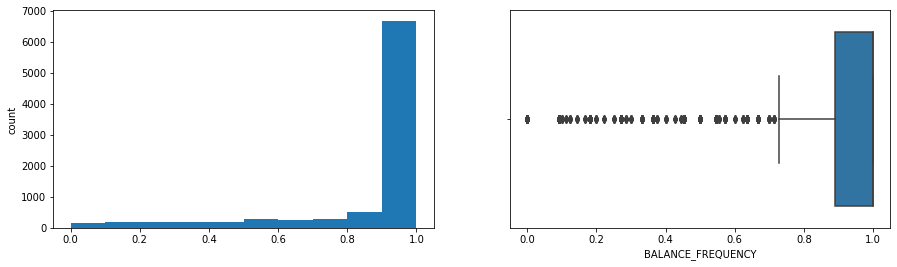

PURCHASES
Skew : 8.14


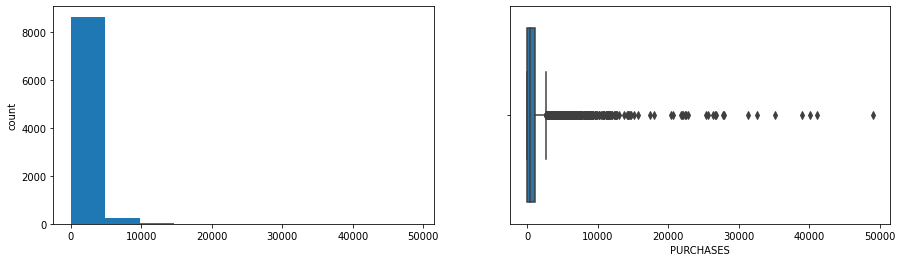

ONEOFF_PURCHASES
Skew : 10.04


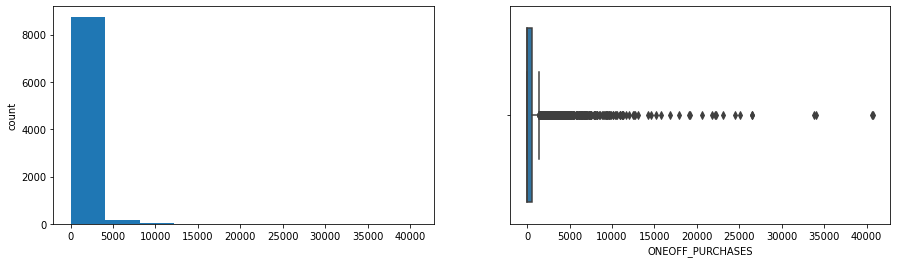

INSTALLMENTS_PURCHASES
Skew : 7.3


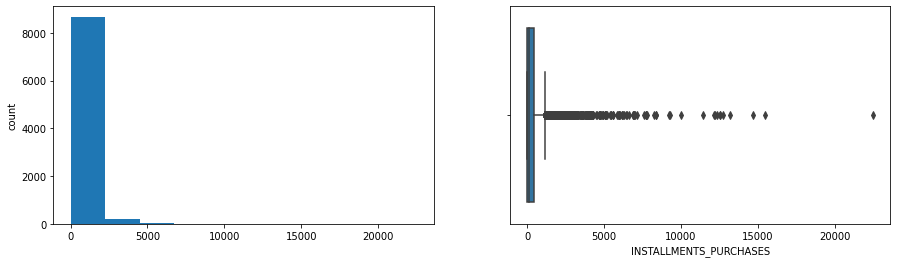

CASH_ADVANCE
Skew : 5.17


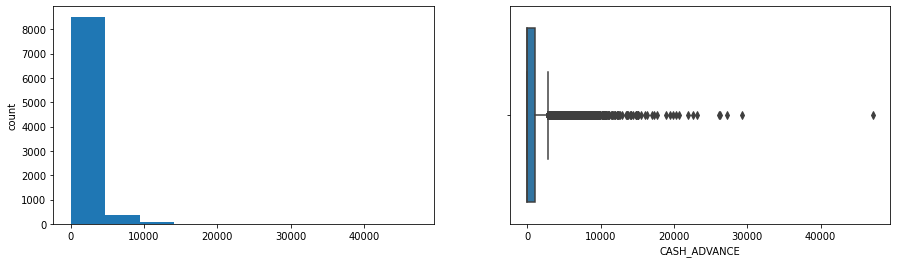

PURCHASES_FREQUENCY
Skew : 0.06


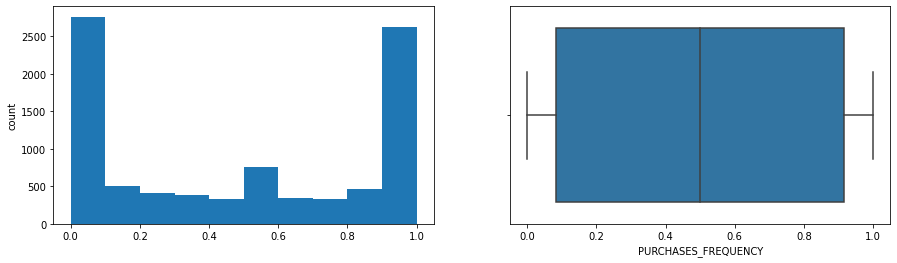

ONEOFF_PURCHASES_FREQUENCY
Skew : 1.54


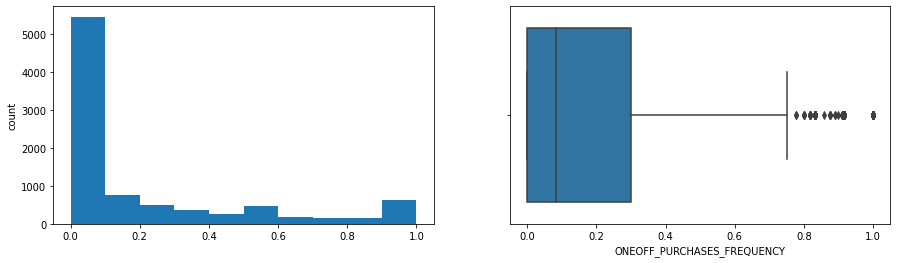

PURCHASES_INSTALLMENTS_FREQUENCY
Skew : 0.51


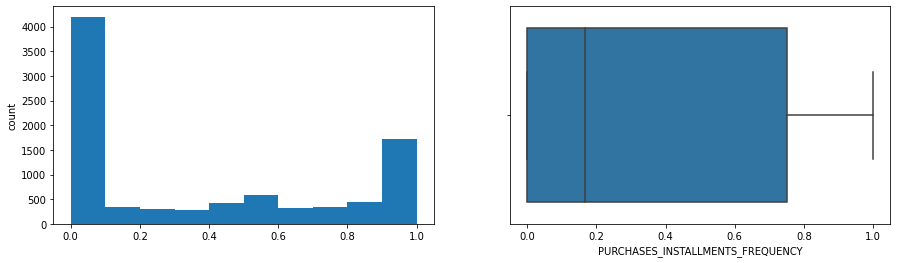

CASH_ADVANCE_FREQUENCY
Skew : 1.83


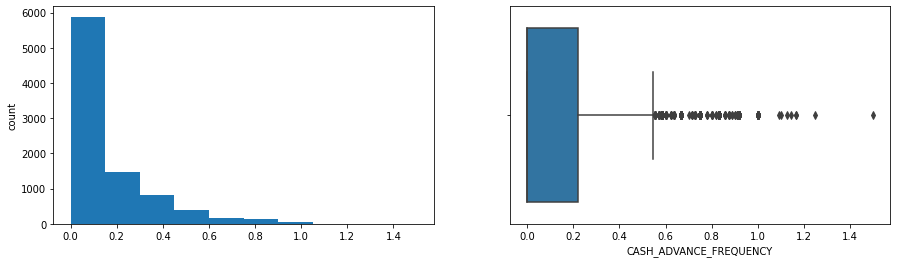

CASH_ADVANCE_TRX
Skew : 5.72


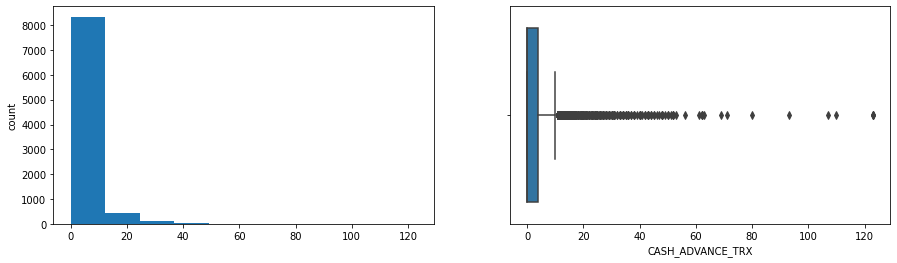

PURCHASES_TRX
Skew : 4.63


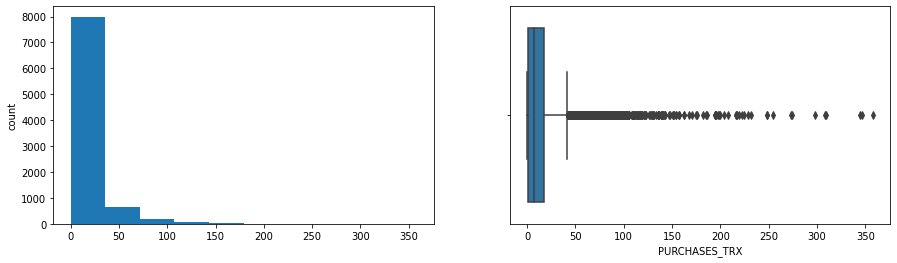

CREDIT_LIMIT
Skew : 1.52


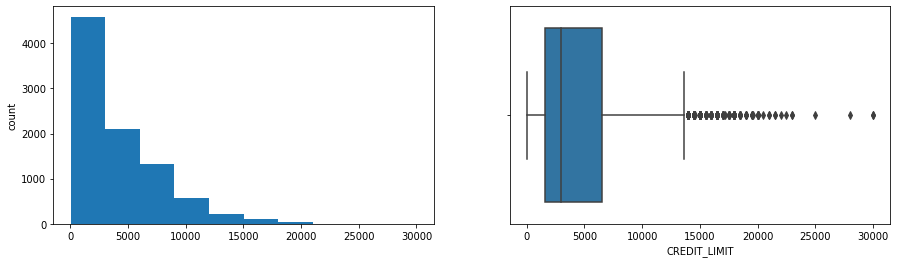

PAYMENTS
Skew : 5.91


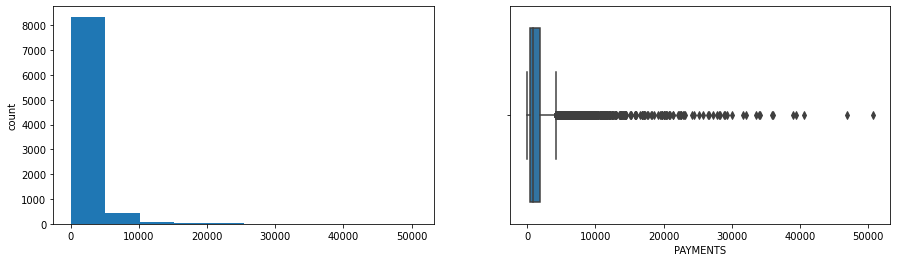

MINIMUM_PAYMENTS
Skew : 13.85


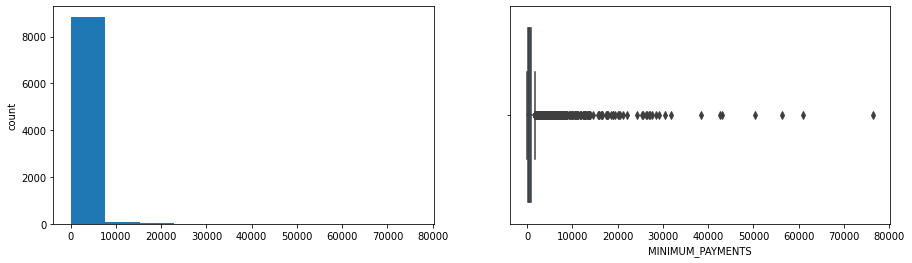

PRC_FULL_PAYMENT
Skew : 1.94


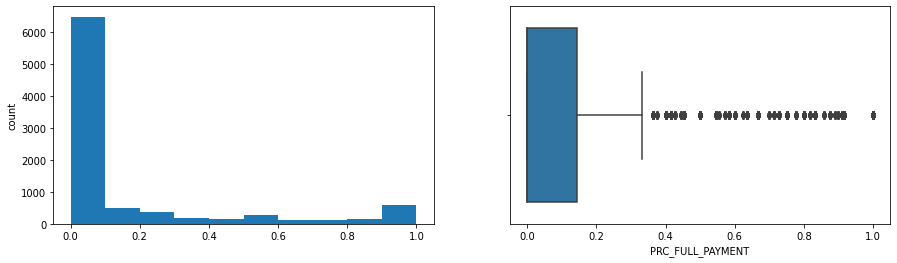

TENURE
Skew : -2.94


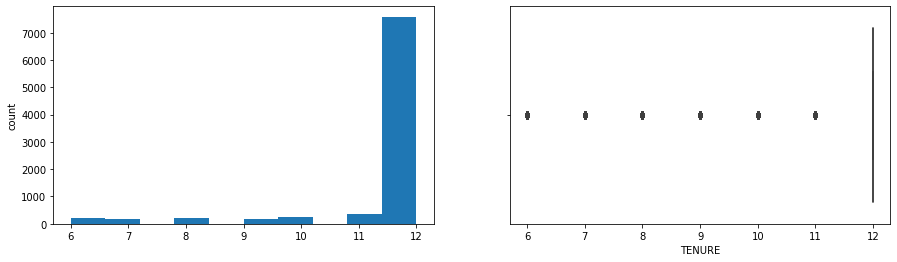

In [32]:
for col in data_new.columns[1:]:
    print(col)
    print('Skew :',round(data_new[col].skew(),2))
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    data_new[col].hist(bins=10, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=data_new[col])
    plt.show()

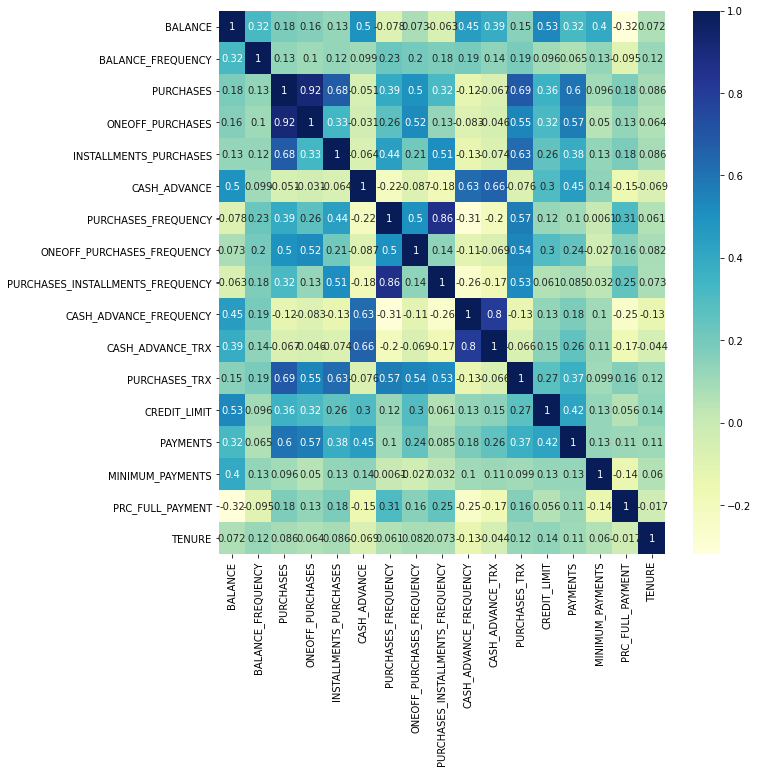

In [33]:
plt.figure(figsize  = (10,10))
sns.heatmap(data_new.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [38]:
#Scaling the data and converting the storing the output as a dataframe
scaler=StandardScaler()
data_scaled=pd.DataFrame(scaler.fit_transform(data_new), columns=data_new.columns)
data_scaled.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.302427,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.097453,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.093330,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.228291,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.257295,-0.525588,0.360541


In [39]:
data_scaled.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.302427,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.097453,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.093330,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.228291,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.257295,-0.525588,0.360541


In [42]:
data_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8949 entries, 0 to 8948
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8949 non-null   float64
 1   BALANCE_FREQUENCY                 8949 non-null   float64
 2   PURCHASES                         8949 non-null   float64
 3   ONEOFF_PURCHASES                  8949 non-null   float64
 4   INSTALLMENTS_PURCHASES            8949 non-null   float64
 5   CASH_ADVANCE                      8949 non-null   float64
 6   PURCHASES_FREQUENCY               8949 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8949 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8949 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8949 non-null   float64
 10  CASH_ADVANCE_TRX                  8949 non-null   float64
 11  PURCHASES_TRX                     8949 non-null   float64
 12  CREDIT

In [43]:
#Defining the number of principal components to generate 
n=data_scaled.shape[1]

#Finding principal components for the data
pca = PCA(n_components=n, random_state=1)
data_pca1 = pd.DataFrame(pca.fit_transform(data_scaled))

#The percentage of variance explained by each principal component
exp_var = pca.explained_variance_ratio_

Text(0, 0.5, 'Cumulative Explained Variance')

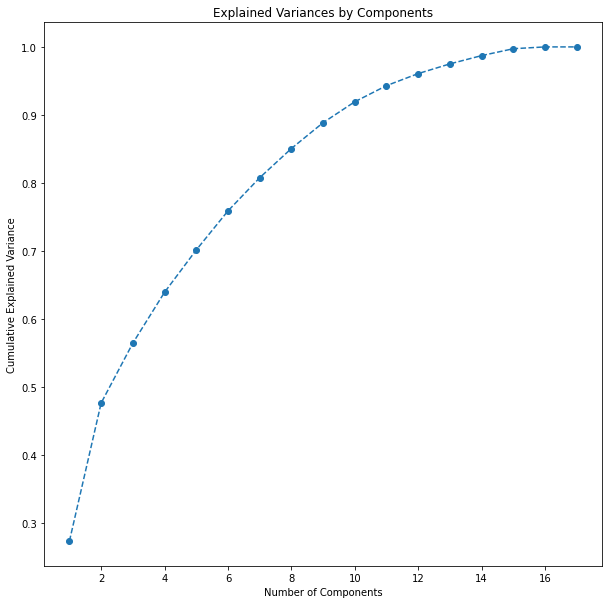

In [44]:
# visulaize the Explained Individual Components
plt.figure(figsize = (10,10))
plt.plot(range(1,18), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title("Explained Variances by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")

In [45]:
# find the least number of components that can explain more than 70% variance
sum = 0
for ix, i in enumerate(exp_var):
  sum = sum + i
  if(sum>0.70):
    print("Number of PCs that explain at least 70% variance: ", ix+1)
    break

Number of PCs that explain at least 70% variance:  5


In [48]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
data_pca1 = pd.DataFrame(pca.fit_transform(data_scaled))


In [54]:
data_pca1.T

,0,1,2,3,4,5,6,7,8,9,...,8939,8940,8941,8942,8943,8944,8945,8946,8947,8948
0,-1.683768,-1.134846,0.969060,-0.888423,-1.600261,0.252678,6.349918,0.275840,-0.442452,-0.563939,...,0.052549,-0.623283,-0.594954,-2.209302,-1.113342,-0.362124,-0.580367,-0.928482,-2.337442,-0.557578
1,-1.072570,2.508738,-0.383487,0.004393,-0.684049,-0.776406,-0.703512,-1.288226,-0.459597,-0.366953,...,-2.302972,4.202594,-1.865523,-1.259277,-0.829480,-2.012990,-1.675243,-1.807724,-0.653445,-0.400281
2,0.477244,0.603529,0.092648,1.501618,0.349762,-1.148740,2.089823,-1.829560,0.179759,1.945204,...,-0.763758,-1.461388,-1.117363,1.501326,1.216175,-0.982611,-1.229166,-0.464896,0.976834,1.026846
3,0.679144,-0.110178,1.236655,1.073551,1.012481,0.816890,-0.770406,0.188580,1.030581,0.991510,...,-3.461430,-3.310990,-2.360551,-1.455847,-1.030258,-2.744160,-1.981807,-2.298423,-1.851985,-1.944621
4,0.043123,0.668379,-2.166478,0.226286,-0.454576,0.824175,-1.071579,0.182352,-0.226463,0.407292,...,0.501789,0.419799,-0.095901,0.255974,-0.712405,0.110762,-0.091111,0.219132,-0.086787,-1.458896
5,0.069705,-1.096278,-0.332914,-0.169366,0.076857,0.430538,-1.070137,-0.067028,-0.302052,-0.634245,...,2.137364,2.255565,2.958146,3.413501,3.345839,2.678602,3.314648,2.985697,3.185600,3.670204
6,0.821505,-0.385953,-1.540257,-0.236559,0.697249,0.777051,-1.397250,0.420891,-0.090415,-0.766507,...,-1.975039,-2.429630,-1.389759,-1.247161,-1.741228,-1.564051,-1.069727,-1.405100,-0.976540,-1.418648
7,-0.018196,0.176700,-0.230296,-0.690792,0.246259,0.062919,1.145931,-0.530755,-0.422887,-1.066973,...,1.200902,-1.568382,-0.186697,-0.712468,-0.483572,0.270321,-0.647049,-0.300336,0.223700,-0.412872
8,0.119090,0.675836,-0.868963,-0.064210,0.578784,0.447610,0.247766,0.135417,0.720889,-0.285461,...,1.859715,0.291778,1.103475,-0.037490,0.692357,1.366230,0.935206,0.804951,1.200729,-0.838683
9,-0.078315,-0.778006,-0.001768,0.393873,-0.122271,-0.210670,-0.088076,-0.963072,-0.093533,0.268177,...,-0.299608,-0.801014,-1.103606,-0.152212,-0.216962,-0.843409,-1.243661,-0.828232,0.270437,0.348111


In [55]:
def color_high(val):
    if val <-0.25: # you can decide any value as per your understanding
        return 'background: pink'
    elif val >0.25:
        return 'background: skyblue'   
    
data_pca1.T.style.applymap(color_high)

In [56]:
data_pca1.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,-1.683768,-1.072570,0.477244,0.679144,0.043123,0.069705,0.821505,-0.018196,0.119090,-0.078315,-0.235969,-0.052486
1,-1.134846,2.508738,0.603529,-0.110178,0.668379,-1.096278,-0.385953,0.176700,0.675836,-0.778006,-0.870632,-0.607215
2,0.969060,-0.383487,0.092648,1.236655,-2.166478,-0.332914,-1.540257,-0.230296,-0.868963,-0.001768,-0.762181,0.683761
3,-0.888423,0.004393,1.501618,1.073551,0.226286,-0.169366,-0.236559,-0.690792,-0.064210,0.393873,0.747575,0.119301
4,-1.600261,-0.684049,0.349762,1.012481,-0.454576,0.076857,0.697249,0.246259,0.578784,-0.122271,-0.455086,-0.108767


Text(0, 0.5, 'PC2')

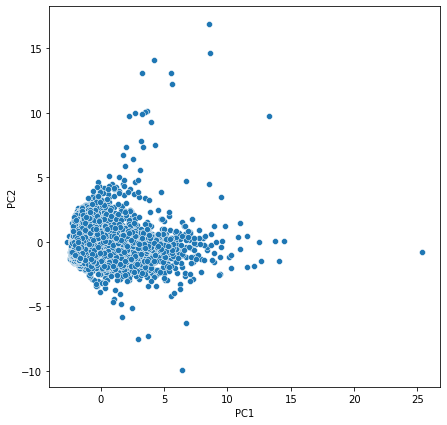

In [58]:
plt.figure(figsize = (7,7))
sns.scatterplot(x=data_pca1[1],y=data_pca1[2])
plt.xlabel("PC1")
plt.ylabel("PC2")

In [65]:
data_scaled = data_pca1.copy(deep=True)

In [66]:
#Creating copy of the data to store labels from each algorithm
data_scaled_copy = data_scaled.copy(deep=True)

In [67]:
data_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
0,8949.0,0.000000e+00,2.154226,-2.780325,-1.483484,-0.455577,0.762314,29.602890
1,8949.0,-6.351930e-18,1.858449,-2.679766,-1.264362,-0.486022,0.738200,25.368988
2,8949.0,-4.486050e-17,1.224034,-9.882558,-0.771810,0.051734,0.560076,16.919129
3,8949.0,-2.540772e-17,1.127751,-11.119260,-0.625531,0.135621,0.704185,13.926294
4,8949.0,-9.527895e-18,1.028801,-2.785643,-0.531571,-0.079176,0.530443,17.071285
5,8949.0,-3.811158e-17,0.987834,-6.310635,-0.484670,-0.089019,0.165946,10.583551
6,8949.0,1.587982e-18,0.911229,-6.605109,-0.503200,0.156398,0.609534,8.771446
7,8949.0,1.905579e-17,0.854891,-6.082976,-0.466922,-0.028770,0.333578,15.376735
8,8949.0,-3.255364e-17,0.803775,-6.878090,-0.459025,0.109172,0.551926,7.452106
9,8949.0,6.351930e-18,0.723652,-8.660266,-0.332732,0.014270,0.327373,10.789947


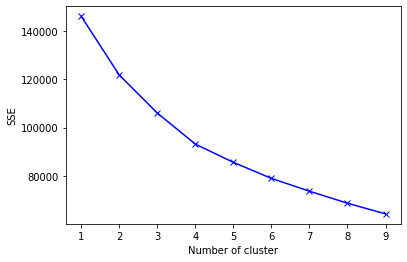

In [68]:
#Empty dictionary to store the SSE for each value of k
sse = {} 

# iterate for a range of Ks and fit the scaled data to the algorithm. Use inertia attribute from the clustering object and 
# store the inertia value for that k 
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(data_scaled)
    sse[k] = kmeans.inertia_

#Elbow plot
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

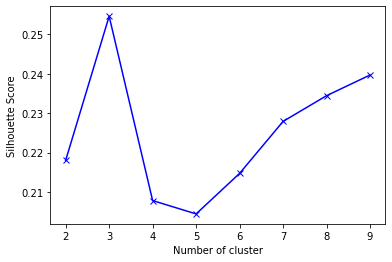

In [69]:
#Empty dictionary to store the silhouette score for each value of k
sc = {} 

# iterate for a range of Ks and fit the scaled data to the algorithm. Store the silhouette score for that k 
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(data_scaled)
    labels = kmeans.predict(data_scaled)
    sc[k] = silhouette_score(data_scaled, labels)

#Elbow plot
plt.figure()
plt.plot(list(sc.keys()), list(sc.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [70]:

kmeans = KMeans(n_clusters=3, random_state=1)
kmeans.fit(data_scaled)

#Adding predicted labels to the original data and scaled data 
data_scaled_copy['KMeans_Labels'] = kmeans.predict(data_scaled)
data_new['KMeans_Labels'] = kmeans.predict(data_scaled)


In [71]:
data_new['KMeans_Labels'].value_counts()

1    6100
2    1566
0    1283
Name: KMeans_Labels, dtype: int64

In [72]:
#Calculating mean and median of the original data for each label
mean = data_new.groupby('KMeans_Labels').mean()
median = data_new.groupby('KMeans_Labels').median()
df_kmeans = pd.concat([mean, median], axis=0)
df_kmeans.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']
df_kmeans.T

,group_0 Mean,group_1 Mean,group_2 Mean,group_0 Median,group_1 Median,group_2 Median
BALANCE,2169.505422,804.297503,4030.869148,1190.800122,432.247725,3519.088900
BALANCE_FREQUENCY,0.981462,0.834341,0.959584,1.000000,1.000000,1.000000
PURCHASES,4171.677537,493.750890,392.426916,3048.400000,299.780000,0.000000
ONEOFF_PURCHASES,2657.935698,245.174587,253.268193,1741.300000,0.000000,0.000000
INSTALLMENTS_PURCHASES,1514.209493,248.898100,139.237695,1063.700000,75.000000,0.000000
CASH_ADVANCE,440.812522,339.140067,3912.128180,0.000000,0.000000,3134.765215
PURCHASES_FREQUENCY,0.947524,0.459866,0.234855,1.000000,0.416667,0.000000
ONEOFF_PURCHASES_FREQUENCY,0.665117,0.128435,0.111874,0.750000,0.000000,0.000000
PURCHASES_INSTALLMENTS_FREQUENCY,0.736642,0.342100,0.146739,0.916667,0.166667,0.000000
CASH_ADVANCE_FREQUENCY,0.061701,0.069811,0.449787,0.000000,0.000000,0.416667


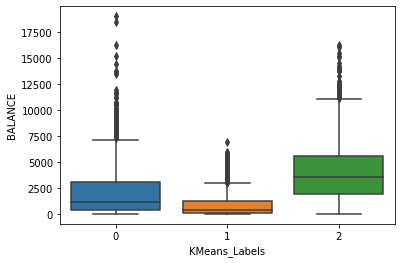

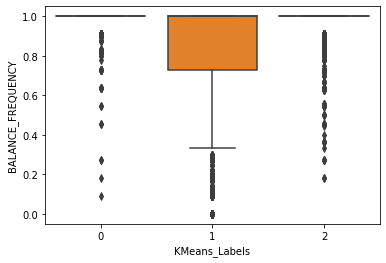

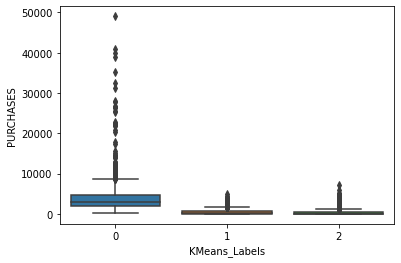

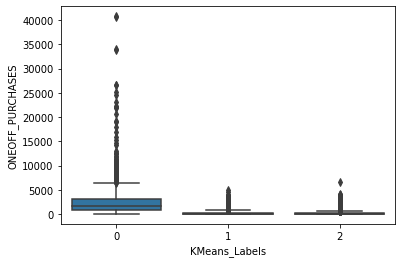

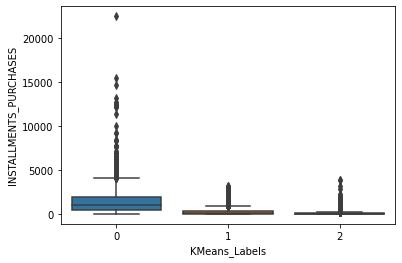

...

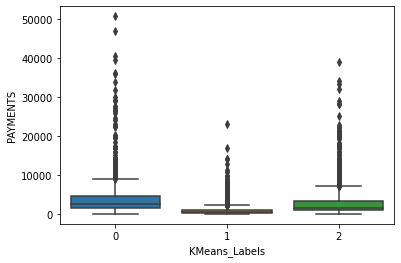

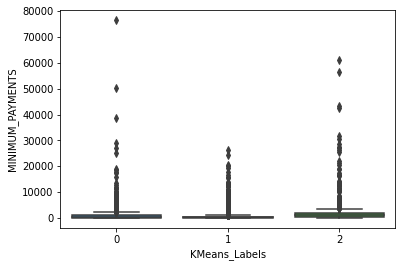

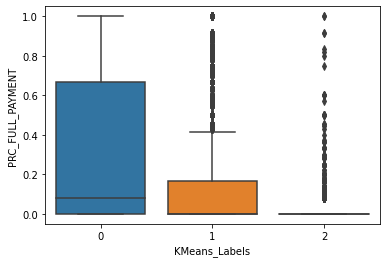

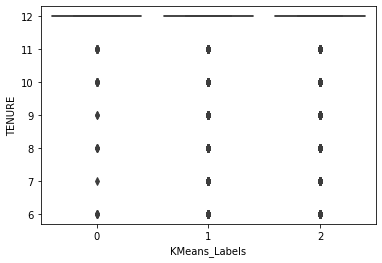

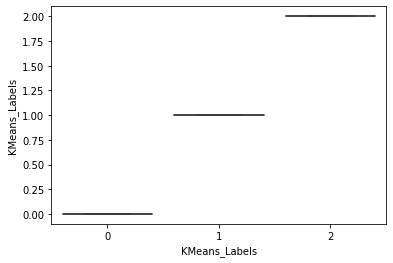

In [74]:
cols_visualise = data_new.columns

for col in cols_visualise:
    sns.boxplot(x = 'KMeans_Labels', y = col, data = data_new)
    plt.show()

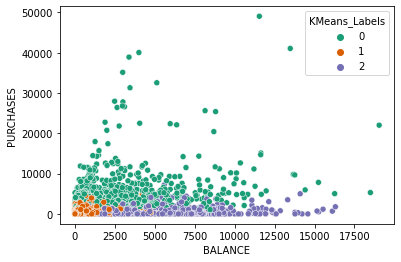

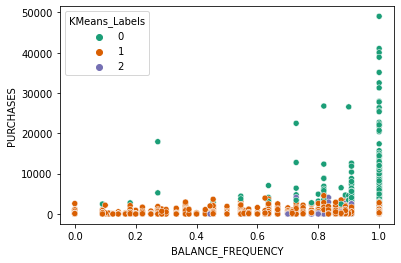

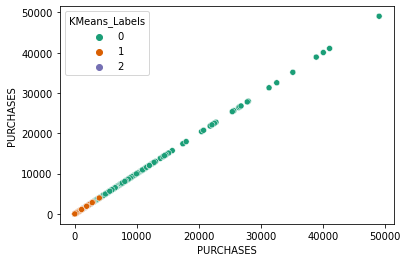

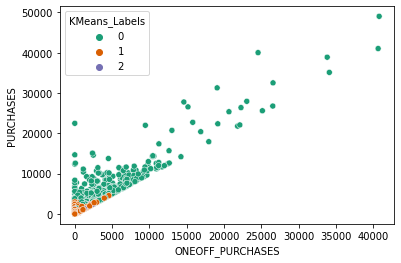

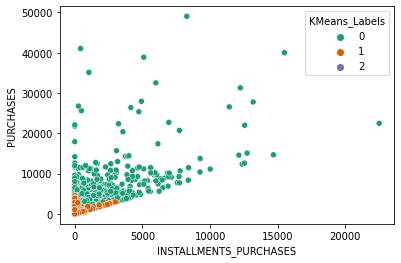

...

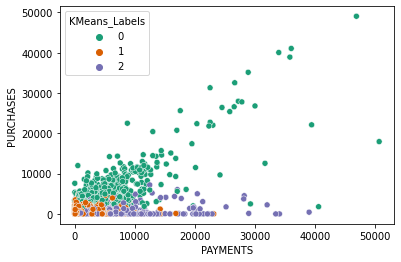

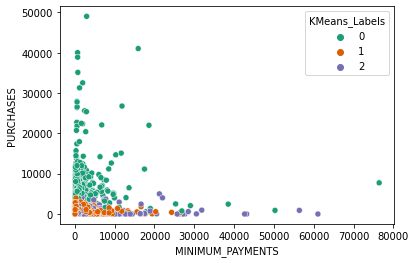

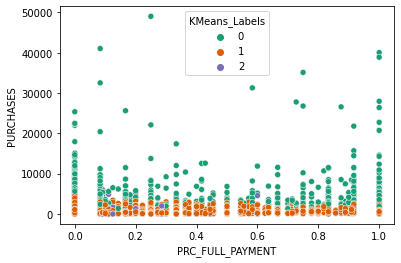

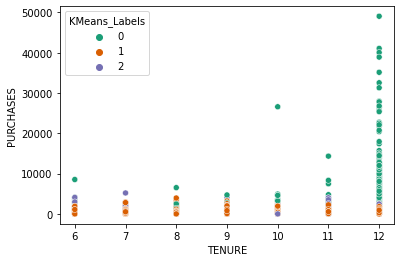

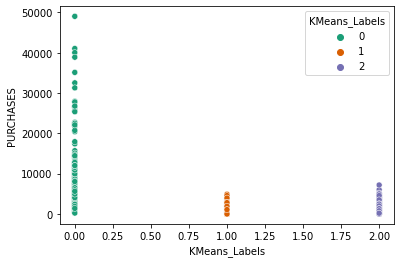

In [76]:
#cols_visualise = ['age', 'tenure',  'property_valuation']
for col in cols_visualise:
    sns.scatterplot(x = col, y = 'PURCHASES',data = data_new ,hue='KMeans_Labels', palette='Dark2')
    plt.show()

In [ ]:
from sklearn_extra.cluster import KMedoids 

In [ ]:
kmedo = KMedoids(n_clusters = 3, random_state=1)
kmedo.fit(data_scaled)

data_scaled_copy['kmedoLabels'] = kmedo.predict(data_scaled)
data_new['kmedoLabels'] = kmedo.predict(data_scaled)

In [ ]:
data_new.kmedoLabels.value_counts()

In [ ]:
#Calculating mean and median of the original data for each label
original_features = ['age', 'tenure',  'property_valuation']

mean = data_new.groupby('kmedoLabels').mean()
median = data_new.groupby('kmedoLabels').median()
df_kmedoids = pd.concat([mean, median], axis=0)
df_kmedoids.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']
df_kmedoids[original_features].T

In [ ]:
for col in cols_visualise:
    sns.boxplot(x = 'kmedoLabels', y = col, data = data_new)
    plt.show()

In [ ]:
cols_visualise = ['age', 'tenure',  'property_valuation']
for col in cols_visualise:
    sns.scatterplot(x = col, y = 'purchases',data = data_new ,hue='kmedoLabels', palette='Dark2')
    plt.show()

In [ ]:
gmm = GaussianMixture(n_components = 3, random_state = 1)
gmm.fit(data_scaled)

data_scaled_copy['GmmLabels'] = gmm.predict(data_scaled)
data_new['GmmLabels'] = gmm.predict(data_scaled)

In [ ]:
data_new.GmmLabels.value_counts()

In [ ]:
#Calculating mean and median of the original data for each label
original_features = ['age', 'tenure',  'property_valuation']

mean = data_new.groupby('GmmLabels').mean()
median = data_new.groupby('GmmLabels').median()
df_gmm = pd.concat([mean, median], axis=0)
df_gmm.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median']
df_gmm[original_features].T

In [ ]:
cols_visualise = ['age', 'tenure',  'property_valuation']
for col in cols_visualise:
    sns.scatterplot(x = col, y = 'purchases',data = data_new ,hue='GmmLabels', palette='Dark2')
    plt.show()

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
# List of all linkage methods to check
methods = ['single',
           'average', 
           'complete',
           'ward']

# Create a subplot image
fig, axs = plt.subplots(len(methods), 1, figsize=(20, 15))

# Enumerate through the list of all methods above, get linkage and plot dendrogram
for i, method in enumerate(methods):
    Z = linkage(data_scaled, metric='euclidean', method=method)
    dendrogram(Z, ax=axs[i]);
    axs[i].set_title(f'Dendrogram ({method.capitalize()} Linkage)')
    axs[i].set_ylabel('Distance')

In [ ]:
#Clustering with number of clusters equal to 4
hierarchical = AgglomerativeClustering(n_clusters=4,affinity='euclidean', linkage='complete')
hierarchical.fit(data_scaled)

In [ ]:
data_scaled_copy['HCLabels'] = hierarchical.labels_
data_new['HCLabels'] = hierarchical.labels_

In [ ]:
data_new.HCLabels.value_counts()

In [ ]:
#Checking 3 countries in cluster 2
data_new[data_new.HCLabels==2]

In [ ]:
#Checking 1 country in cluster 3
data_new[data_new.HCLabels==3]

In [ ]:
#Calculating mean and median of the original data for each label
original_features = ['age', 'tenure',  'property_valuation']
mean = data_new.groupby('HCLabels').mean()
median = data_new.groupby('HCLabels').median()
df_hierachical = pd.concat([mean, median], axis=0)
df_hierachical.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median']
df_hierachical[original_features].T

In [ ]:
for col in original_features:
    sns.boxplot(x = 'HCLabels', y = col, data = data_new)
    plt.show()

In [ ]:
dbs = DBSCAN(eps = 1)
data_scaled_copy['DBSLabels'] = dbs.fit_predict(data_scaled)
data_new['DBSLabels'] = dbs.fit_predict(data_scaled)

In [ ]:
data_new['DBSLabels'].value_counts()

In [ ]:
#Calculating mean and median of the original data for each label
original_features = ['age', 'tenure',  'property_valuation']

mean = data_new.groupby('DBSLabels').mean()
median = data_new.groupby('DBSLabels').median()
df_hierachical = pd.concat([mean, median], axis=0)
df_hierachical.index = ['group_-1 Mean', 'group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_-1 Median', 'group_0 Median', 'group_1 Median', 'group_2 Median']
df_hierachical[original_features].T

In [ ]:
for col in cols_visualise:
    sns.boxplot(x = 'DBSLabels', y = col, data = data_new)
    plt.show()